<a href="https://colab.research.google.com/github/dheerajkumar1a1a/Kaggle_github/blob/main/arrclean_tomato_Ranchi_prophet_univ.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import cufflinks as cf
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default='plotly_white'
import os
# import plotly.io as pio
# pio.renderers.default = 'colab'
import seaborn as sns
import plotly.express as px
%matplotlib inline
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning:

A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5



# Reading & plotting complete data for Ranchi center

In [2]:
parent_df={}
parent_df['RANCHI']=pd.read_csv('/kaggle/input/tomtao-prices-a-q/complete_data.csv',index_col=0,parse_dates=[0])

In [3]:
# sns.lineplot(data=parent_df['RANCHI'])

parent_df['RANCHI'].iplot()

# Plotting only Retail Prices & Arrival Quantity

In [4]:
px.line(parent_df['RANCHI'],x=parent_df['RANCHI'].index,y=['Retail Prices','Arrival Quantity'])

# Plotting Arrival Quantity

In [5]:
px.line(parent_df['RANCHI'],x=parent_df['RANCHI'].index,y=['Arrival Quantity'])

# Dropping the ouliers with arrival qty less than threshold set for keeping the data

**For example here 300 is the threshold and two values are 220 and 160 being the local outliers will not be dropped.**

In [6]:
parent_df['RANCHI'].drop(['2010-02-18','2012-06-27','2014-05-30'],inplace=True)

In [7]:
parent_df['RANCHI'].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7468 entries, 2002-01-01 to 2023-06-30
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Arrival Quantity  4954 non-null   float64
 1   Retail Prices     4954 non-null   float64
 2   Min Price         4954 non-null   float64
 3   Max Price         4954 non-null   float64
 4   Modal Price       4954 non-null   float64
dtypes: float64(5)
memory usage: 350.1 KB


# Looking for the chnages

In [8]:
px.line(parent_df['RANCHI'],x=parent_df['RANCHI'].index,y=['Arrival Quantity'])

# Checking data from 2010 onwards

In [9]:
parent_df['RANCHI'].loc['2010':'2019','Arrival Quantity'].isnull().sum()

854

In [10]:
parent_df['RANCHI']['Arrival Quantity'].fillna(-1,inplace=True)

In [11]:
parent_df['RANCHI'].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7468 entries, 2002-01-01 to 2023-06-30
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Arrival Quantity  7468 non-null   float64
 1   Retail Prices     4954 non-null   float64
 2   Min Price         4954 non-null   float64
 3   Max Price         4954 non-null   float64
 4   Modal Price       4954 non-null   float64
dtypes: float64(5)
memory usage: 608.1 KB


In [12]:
parent_df['RANCHI']=parent_df['RANCHI'][parent_df['RANCHI']['Arrival Quantity']<=300]

In [13]:
parent_df['RANCHI'].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7466 entries, 2002-01-01 to 2023-06-30
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Arrival Quantity  7466 non-null   float64
 1   Retail Prices     4952 non-null   float64
 2   Min Price         4952 non-null   float64
 3   Max Price         4952 non-null   float64
 4   Modal Price       4952 non-null   float64
dtypes: float64(5)
memory usage: 350.0 KB


In [14]:
px.line(parent_df['RANCHI'],x=parent_df['RANCHI'].index,y=['Arrival Quantity'])

In [15]:
parent_df['RANCHI']['Arrival Quantity'].replace(-1,np.nan,inplace=True)

In [16]:
parent_df['RANCHI'].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7466 entries, 2002-01-01 to 2023-06-30
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Arrival Quantity  4952 non-null   float64
 1   Retail Prices     4952 non-null   float64
 2   Min Price         4952 non-null   float64
 3   Max Price         4952 non-null   float64
 4   Modal Price       4952 non-null   float64
dtypes: float64(5)
memory usage: 350.0 KB


In [17]:
df_Ranchi=parent_df['RANCHI'].copy()

In [18]:
df_Ranchi['2011':'2012'].describe()

,Arrival Quantity,Retail Prices,Min Price,Max Price,Modal Price
count,580.000000,580.000000,580.000000,580.000000,580.000000
mean,21.462069,1725.517241,772.468966,1044.360345,886.324138
std,8.741160,990.688378,358.291856,673.969941,401.884265
min,1.000000,500.000000,150.000000,245.000000,200.000000
25%,16.000000,1000.000000,400.000000,600.000000,500.000000
50%,22.000000,1600.000000,790.000000,1000.000000,900.000000
75%,28.000000,2400.000000,1100.000000,1400.000000,1200.000000
max,60.000000,18000.000000,2100.000000,13004.000000,2250.000000


In [19]:
df_Ranchi['2011':'2014']['Retail Prices'].iplot()

In [20]:
df_Ranchi_1=df_Ranchi.copy()
df_Ranchi.isnull().sum()

Arrival Quantity    2514
Retail Prices       2514
Min Price           2514
Max Price           2514
Modal Price         2514
dtype: int64

In [21]:
# https://www.ceicdata.com/en/india/retail-price-department-of-agriculture-and-cooperation-food-by-cities-tomato/retail-price-doac-tomato-jharkhand-ranchi
# above is the source provided to prove that 18k price is an outlier

df_Ranchi_1=df_Ranchi_1[df_Ranchi_1['Retail Prices']<10000]
df_Ranchi_1.isnull().sum()
# df_Ranchi['Retail Prices'].iplot()

Arrival Quantity    0
Retail Prices       0
Min Price           0
Max Price           0
Modal Price         0
dtype: int64

In [22]:
df_Ranchi_1.describe()

,Arrival Quantity,Retail Prices,Min Price,Max Price,Modal Price
count,4950.000000,4950.000000,4950.000000,4950.000000,4950.000000
mean,30.240808,1661.608081,883.840278,1182.380606,1017.894343
std,25.911958,1274.757700,619.566858,811.997736,716.146948
min,0.000000,0.000000,0.375000,70.000000,0.000000
25%,15.000000,800.000000,400.000000,600.000000,480.000000
50%,25.000000,1500.000000,750.000000,1000.000000,850.000000
75%,40.000000,2500.000000,1150.000000,1560.000000,1300.000000
max,300.000000,9000.000000,11250.000000,13004.000000,12500.000000


In [23]:
df_Ranchi=df_Ranchi['2010':'2020'].copy()


In [24]:
df_Ranchi_1=df_Ranchi_1['2010':'2020'].copy()
df_Ranchi_1.isnull().sum()

Arrival Quantity    0
Retail Prices       0
Min Price           0
Max Price           0
Modal Price         0
dtype: int64

In [25]:
df_Ranchi_dropped=df_Ranchi_1.dropna()

In [26]:
df_Ranchi_dropped['Arrival Quantity']['2020'].iplot()

In [27]:
df_Ranchi_dropped.iplot()

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

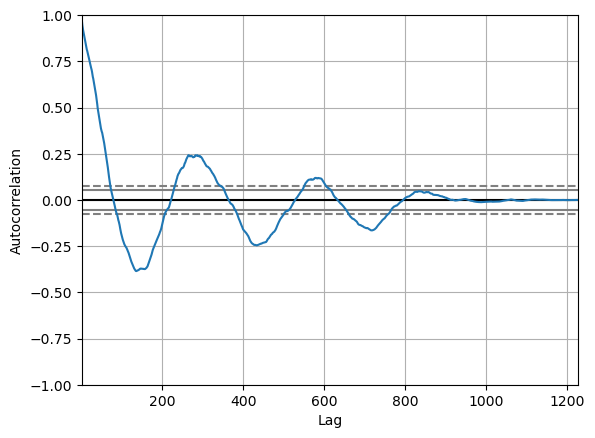

In [28]:
pd.plotting.autocorrelation_plot(df_Ranchi_dropped['2016':'2020']['Arrival Quantity'])

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

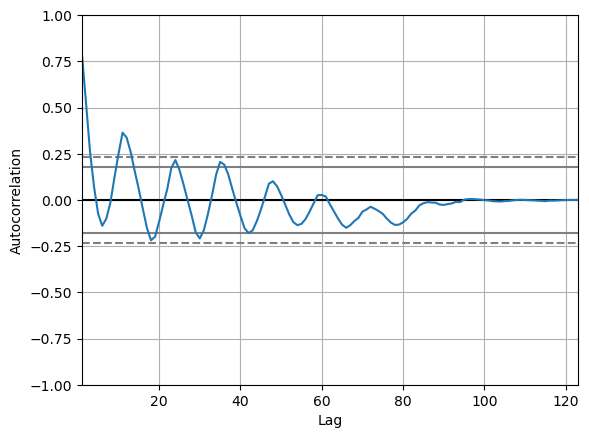

In [29]:
pd.plotting.autocorrelation_plot(df_Ranchi_dropped['2010':'2020']['Arrival Quantity'].resample('1m').max())

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

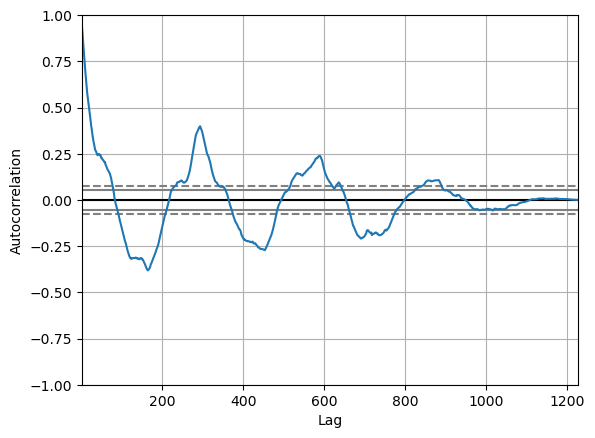

In [30]:
pd.plotting.autocorrelation_plot(df_Ranchi_dropped['2016':'2020']['Retail Prices'])

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

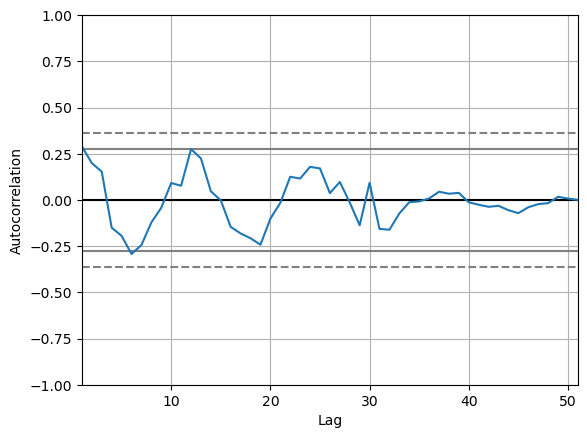

In [31]:
pd.plotting.autocorrelation_plot(df_Ranchi_dropped['2016':'2020']['Retail Prices'].resample('1m').max())

<Axes: xlabel='y(t)', ylabel='y(t + 4)'>

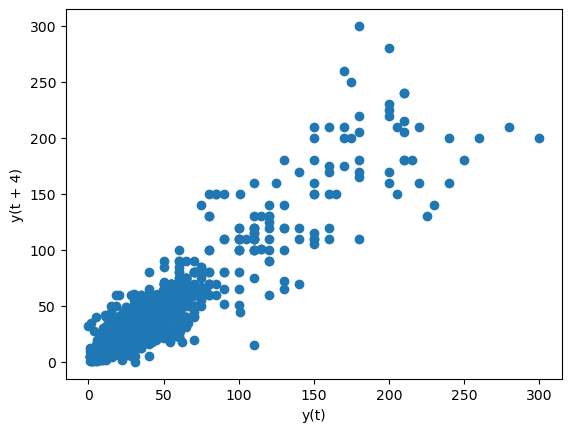

In [32]:
pd.plotting.lag_plot(df_Ranchi_1['Arrival Quantity'],lag=4)

<Axes: xlabel='y(t)', ylabel='y(t + 1)'>

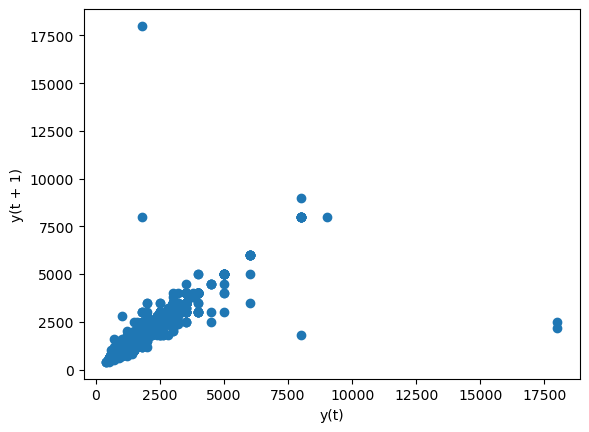

In [33]:
pd.plotting.lag_plot(df_Ranchi['Retail Prices'],lag=1)

In [34]:
from statsmodels.tsa.stattools import adfuller


# In[19]:


test_result=adfuller(df_Ranchi_dropped['Arrival Quantity'])


# In[20]:


#Ho: It is non stationary
#H1: It is stationary

def adfuller_test(sales):
    result=adfuller(sales)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")


In [35]:
adfuller_test(df_Ranchi_dropped['Arrival Quantity'])

ADF Test Statistic : -4.493579348334501
p-value : 0.0002019601054302074
#Lags Used : 4
Number of Observations Used : 2920
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


In [36]:
adfuller_test(df_Ranchi_dropped['Retail Prices'])

ADF Test Statistic : -6.34920690147482
p-value : 2.636345497638967e-08
#Lags Used : 1
Number of Observations Used : 2923
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


In [37]:
df_Ranchi.isnull().sum()

Arrival Quantity    882
Retail Prices       882
Min Price           882
Max Price           882
Modal Price         882
dtype: int64

In [38]:
df_Ranchi.fillna(-1,inplace=True)

In [39]:
df_Ranchi=df_Ranchi[df_Ranchi['Retail Prices']<10000]

In [40]:
df_Ranchi.replace(-1,np.nan,inplace=True)

In [41]:
df_Ranchi_imp=pd.DataFrame()
df_Ranchi_imp['Retail Prices']=df_Ranchi['Retail Prices'].rolling(window=1,min_periods=0).mean().fillna(method='ffill')
df_Ranchi_imp['Arrival Quantity']=df_Ranchi['Arrival Quantity'].rolling(window=4,min_periods=2).mean().fillna(method='ffill')
df_Ranchi_imp['Retail Prices_lag']=df_Ranchi['Retail Prices'].rolling(window=1,min_periods=0).mean().fillna(method='ffill').shift(3)
# df_Ranchi_imp['Arrival Quantity']=df_Ranchi['Arrival Quantity'].rolling(window=5,min_periods=2).mean().fillna(method='bfill')
df_Ranchi_imp=df_Ranchi_imp.dropna()
#df_Ranchi_imp['2008':'2016']['Retail Prices'].plot()
df_Ranchi_imp[['Retail Prices','Retail Prices_lag']].iplot()
df_Ranchi_imp.isnull().sum()

Retail Prices        0
Arrival Quantity     0
Retail Prices_lag    0
dtype: int64

In [42]:
df_Ranchi_imp_month=pd.DataFrame()
df_Ranchi_imp_month['Retail Prices_lag']=df_Ranchi_imp['Retail Prices_lag'].resample('M').mean()
df_Ranchi_imp_month['Arrival Quantity']=df_Ranchi_imp['Arrival Quantity'].resample('M').max()
df_Ranchi_imp_month['Arrival Quantity_mean']=df_Ranchi_imp['Arrival Quantity'].resample('M').mean()
df_Ranchi_imp_month=df_Ranchi_imp_month.dropna()
df_Ranchi_imp_month.index = df_Ranchi_imp_month.index + pd.offsets.MonthBegin(0)
df_Ranchi_imp_month[['Arrival Quantity','Retail Prices_lag']].tail(6)

,Arrival Quantity,Retail Prices_lag
Date,,
2019-11-01,35.500000,3945.161290
2019-12-01,59.000000,2967.741935
2020-01-01,62.000000,1983.870968
2020-02-01,59.333333,2138.709677
2020-03-01,52.000000,1764.516129
2020-04-01,50.333333,1654.838710


In [43]:
finaldf1=df_Ranchi_imp_month[['Arrival Quantity_mean','Retail Prices_lag']].copy()
finaldf1['ds'] = pd.to_datetime(finaldf1.index)
finaldf1.reset_index(drop=True,inplace=True)
#addition of new line to make sure that it doesnt involve covid effects
finaldf1=finaldf1.iloc[:-2,:]
#done
finaldf1.rename(columns={'Retail Prices_lag':'y'},inplace=True)
finaldf1.tail()

,Arrival Quantity_mean,y,ds
116,51.018817,2851.612903,2019-10-01
117,23.271505,3945.161290,2019-11-01
118,49.508065,2967.741935,2019-12-01
119,54.040323,1983.870968,2020-01-01
120,47.110215,2138.709677,2020-02-01


In [44]:
finaldf=df_Ranchi_imp_month[['Arrival Quantity','Retail Prices_lag']].copy()
finaldf['ds'] = pd.to_datetime(finaldf.index)
finaldf.reset_index(drop=True,inplace=True)
#addition of new line to make sure that it doesnt involve covid effects
finaldf=finaldf.iloc[:-2,:]
#done
finaldf.rename(columns={'Retail Prices_lag':'y'},inplace=True)
finaldf.tail()

,Arrival Quantity,y,ds
116,58.333333,2851.612903,2019-10-01
117,35.500000,3945.161290,2019-11-01
118,59.000000,2967.741935,2019-12-01
119,62.000000,1983.870968,2020-01-01
120,59.333333,2138.709677,2020-02-01


In [45]:
finaldf.isnull().sum()

Arrival Quantity    0
y                   0
ds                  0
dtype: int64

In [46]:
finaldf1.corr()

/tmp/ipykernel_21/3994723824.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,Arrival Quantity_mean,y
Arrival Quantity_mean,1.000000,-0.440169
y,-0.440169,1.000000


In [47]:
finaldf.corr()

/tmp/ipykernel_21/1371853549.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,Arrival Quantity,y
Arrival Quantity,1.000000,-0.418031
y,-0.418031,1.000000


In [48]:
#finaldf=finaldf1

In [49]:
import numpy as np
import pandas as pd
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, r2_score,mean_absolute_percentage_error
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.model_selection import train_test_split
from prophet.plot import plot_cross_validation_metric
from prophet.diagnostics import performance_metrics
from prophet.diagnostics import cross_validation

#from sklearn.linear_model import LinearRegression

import plotly.graph_objs as go
from plotly.subplots import make_subplots


import itertools

In [50]:
# splitting train and test data
trainDataSize = 0.80
splitSize = int(finaldf.shape[0]*trainDataSize)
print(splitSize)
train = finaldf[0:splitSize]
test = finaldf[splitSize:]
print(train.shape)
print(test.shape)

prophetColumns =['Arrival Quantity']
# model

model = Prophet()

# adding all columns in add regressor
for col in prophetColumns:
    model.add_regressor(col)
#training model
model.fit(train)

future =test.copy()
future.drop('y',axis=1,inplace=True)

#prediction
prediction = model.predict(future)

13:52:46 - cmdstanpy - INFO - Chain [1] start processing


96
(96, 3)
(25, 3)


13:52:47 - cmdstanpy - INFO - Chain [1] done processing


MAE: 606.759
MAPE: 0.32559283941505557


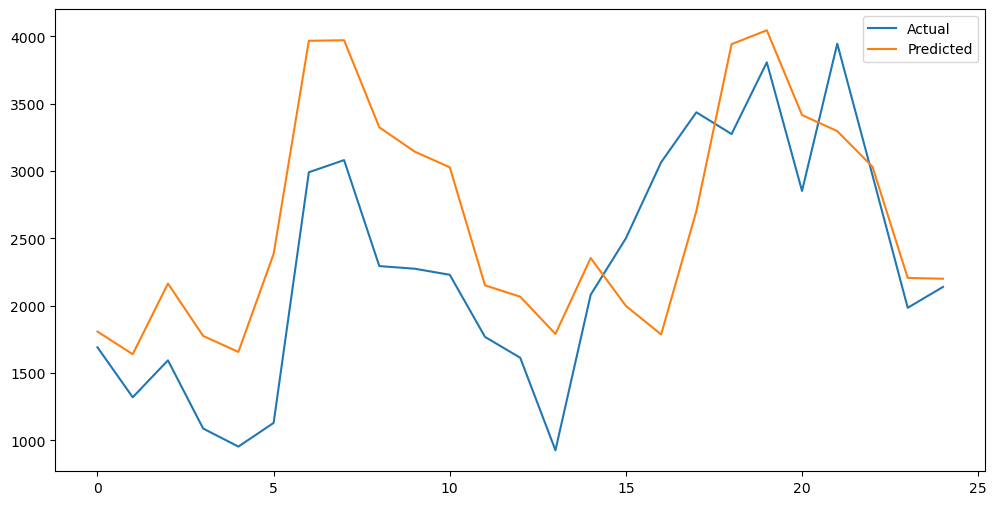

In [51]:
y_true = test['y'].values
y_pred = prediction['yhat'].values


plt.figure(figsize=(12, 6))
mae = mean_absolute_error(y_true, y_pred)
print('MAE: %.3f' % mae)
mape = mean_absolute_percentage_error(y_true, y_pred)
print("MAPE:", mape)
# plot expected vs actual
plt.plot(y_true, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.legend()
plt.show()

In [52]:
import plotly.io as pio
pio.renderers.default = 'colab'

In [53]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=test['ds'].values, y=y_true, name="actual targets"),)
    #secondary_y=False,)
fig.add_trace(
    go.Scatter(x=test['ds'].values, y=y_pred, name="predicted targets"),)
    #secondary_y=True,)
fig.add_trace(go.Scatter(x=finaldf['ds'].values, y=finaldf['y'].values, name="original data"),)
    #secondary_y=True,)
fig.update_layout(
    title_text="Actual vs Predicted Targets")
fig.update_xaxes(title_text="Timeline")
fig.update_yaxes(title_text="actual targets", secondary_y=False)
fig.update_yaxes(title_text="predicted targets", secondary_y=True)
fig.show()

13:52:50 - cmdstanpy - INFO - Chain [1] start processing


96
(96, 3)
(25, 3)


13:52:51 - cmdstanpy - INFO - Chain [1] done processing


MAE: 504.786
MAPE: 0.23399440772504299


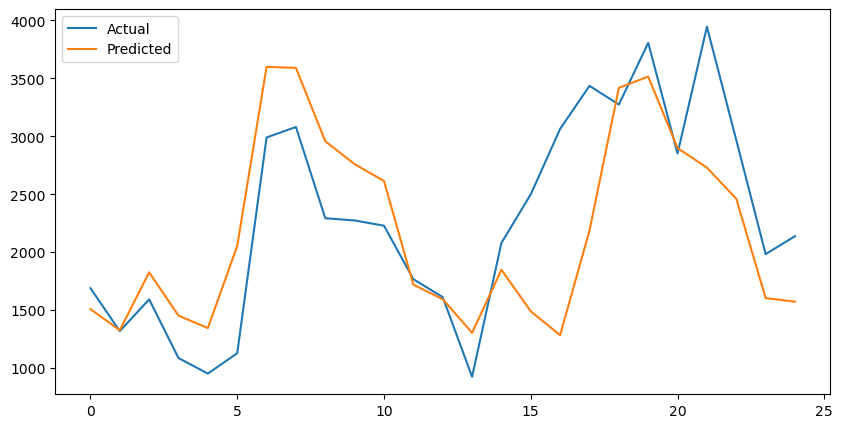

In [54]:
#Trial 2

# splitting train and test data
trainDataSize = 0.80
splitSize = int(finaldf.shape[0]*trainDataSize)
print(splitSize)
train = finaldf[0:splitSize]
test = finaldf[splitSize:]
print(train.shape)
print(test.shape)
prophetColumns =['Arrival Quantity']
# model

#seasonality_mode = 'multiplicative'

#modelWeekly = Prophet(changepoint_range=0.90,changepoint_prior_scale = 0.5)

model = Prophet(changepoint_range=0.95,changepoint_prior_scale = 1,)#seasonality_prior_scale=20)

# adding all columns in add regressor
for col in prophetColumns:
    model.add_regressor(col)
#training model
model.fit(train)

future =test.copy()
future.drop('y',axis=1,inplace=True)

#prediction
prediction = model.predict(future)

y_true = test['y'].values
y_pred = prediction['yhat'].values


plt.figure(figsize=(10, 5))
mae = mean_absolute_error(y_true, y_pred)
print('MAE: %.3f' % mae)
mape = mean_absolute_percentage_error(y_true, y_pred)
print("MAPE:", mape)
# plot expected vs actual
plt.plot(y_true, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.legend()
plt.show()

In [55]:
# with extreme weather and 80% train data, seasonality mode mulitplicative
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=test['ds'].values, y=y_true, name="actual targets"),)
    #secondary_y=False,)
fig.add_trace(
    go.Scatter(x=test['ds'].values, y=y_pred, name="predicted targets"),)
    #secondary_y=True,)
fig.add_trace(go.Scatter(x=finaldf['ds'].values, y=finaldf['y'].values, name="original data"),)
    #secondary_y=True,)
fig.update_layout(
    title_text="Actual vs Predicted Targets")
fig.update_xaxes(title_text="Timeline")
fig.update_yaxes(title_text="actual targets", secondary_y=False)
fig.update_yaxes(title_text="predicted targets", secondary_y=True)
fig.show()

In [56]:
def model_prophet(Prophetdf,n_obs= 115):

    Prophetdf_train=Prophetdf[0:n_obs]
    Prophetdf_test =Prophetdf[n_obs:]
    multi_model = Prophet(interval_width = 0.95)
    Prophet_cols = Prophetdf.columns.tolist()
    Prophet_cols.remove('ds')
    Prophet_cols.remove('y')
    print(Prophetdf_train.columns)
    #print(Prophetdf_test[['ds','y']])

    # adding all columns in add regressor
    for col in Prophet_cols:
        multi_model.add_regressor(col)


    multi_model.fit(Prophetdf_train)
    print('Prophetdf_test.shape[0]')
    print(Prophetdf_test.shape[0])
    # make furture frame
    future = multi_model.make_future_dataframe(periods = Prophetdf_test.shape[0],freq='MS', include_history=True)
    for col in Prophet_cols:
        future[col] =Prophetdf[col]
    print(Prophetdf_test[['ds','y']])
    print('future')
    print(future)

    # predict future
    forecastProphet =  multi_model.predict(future)
    combined_df = pd.merge(Prophetdf_test[['ds','y']],forecastProphet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']], on='ds')

    print(forecastProphet[['ds','yhat', 'yhat_lower','yhat_upper']].tail())

    fig1 = multi_model.plot(forecastProphet)

    Prophetdf.plot(x = 'ds', y = 'y')

    multi_model.plot_components(forecastProphet);


    #print(Prophetdf_test[['ds','y']])
    print(forecastProphet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']][-6:])

    combined_df = pd.merge(Prophetdf_test[['ds','y']],forecastProphet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']][-6:], on='ds')
    #print(combined_df.head())


    #Check MAE value
    MAE = mean_absolute_error(combined_df['y'], combined_df['yhat'])
    print('MAE')
    print(MAE)

#Check MAPE value
    MAPE = mean_absolute_percentage_error(combined_df['y'], combined_df['yhat'])
    print('MAPE')
    print(MAPE)

    import seaborn as sns
    import matplotlib.pyplot as plt
    plt.rcParams.update({'figure.figsize':  (15, 3),  'figure.dpi' : 300})
    fig, ax = plt.subplots()

    sns.lineplot(data = Prophetdf , x = 'ds', y = 'y' ,label = 'Original')
    sns.lineplot(data= forecastProphet, x = 'ds', y = 'yhat', label = 'Forecast')
    plt.grid(linestyle = '-', linewidth = 0.3)

    plt.legend(["Original","forecast"])


    import seaborn as sns
    import matplotlib.pyplot as plt

    plt.rcParams.update({'figure.figsize':  (15, 3),  'figure.dpi' : 300})
    fig, ax = plt.subplots()
    sns.lineplot(data = Prophetdf[-6:] , x = 'ds', y = 'y' ,label = 'Original')
    sns.lineplot(data= forecastProphet[-6:], x = 'ds', y = 'yhat', label = 'Forecast')
    plt.grid(linestyle = '-', linewidth = 0.3)
    plt.legend(["Original","forecast"])



    return MAE

In [57]:
finaldf.loc[:,'Arrival Quantity'].iplot()

In [58]:
# finaldf[finaldf.loc[:,'Arrival Quantity']==0]

In [59]:
finaldf.head()

,Arrival Quantity,y,ds
0,35.333333,810.714286,2010-02-01
1,29.750000,516.666667,2010-03-01
2,30.500000,887.096774,2010-04-01
3,26.666667,861.290323,2010-05-01
4,26.666667,1006.451613,2010-06-01


In [60]:
finaldf1.head()

,Arrival Quantity_mean,y,ds
0,29.029762,810.714286,2010-02-01
1,27.405556,516.666667,2010-03-01
2,24.467742,887.096774,2010-04-01
3,22.201613,861.290323,2010-05-01
4,19.478495,1006.451613,2010-06-01


In [61]:
#HERE we can see that MAE for arrival quantity mean(588.439) resampling is significantly less than that calculated using max resampling(608.916)

13:52:57 - cmdstanpy - INFO - Chain [1] start processing
13:52:57 - cmdstanpy - INFO - Chain [1] done processing


Index(['Arrival Quantity', 'y', 'ds'], dtype='object')
Prophetdf_test.shape[0]
6
            ds            y
115 2019-09-01  3806.451613
116 2019-10-01  2851.612903
117 2019-11-01  3945.161290
118 2019-12-01  2967.741935
119 2020-01-01  1983.870968
120 2020-02-01  2138.709677
future
            ds  Arrival Quantity
0   2010-02-01         35.333333
1   2010-03-01         29.750000
2   2010-04-01         30.500000
3   2010-05-01         26.666667
4   2010-06-01         26.666667
..         ...               ...
116 2019-10-01         58.333333
117 2019-11-01         35.500000
118 2019-12-01         59.000000
119 2020-01-01         62.000000
120 2020-02-01         59.333333

[121 rows x 2 columns]
            ds         yhat   yhat_lower   yhat_upper
116 2019-10-01  3005.674247  2038.899327  4039.602761
117 2019-11-01  3010.785600  2048.067212  3927.667278
118 2019-12-01  2709.849544  1749.817726  3681.912157
119 2020-01-01  1985.426425   957.587890  2936.584733
120 2020-02-01  1954.45681

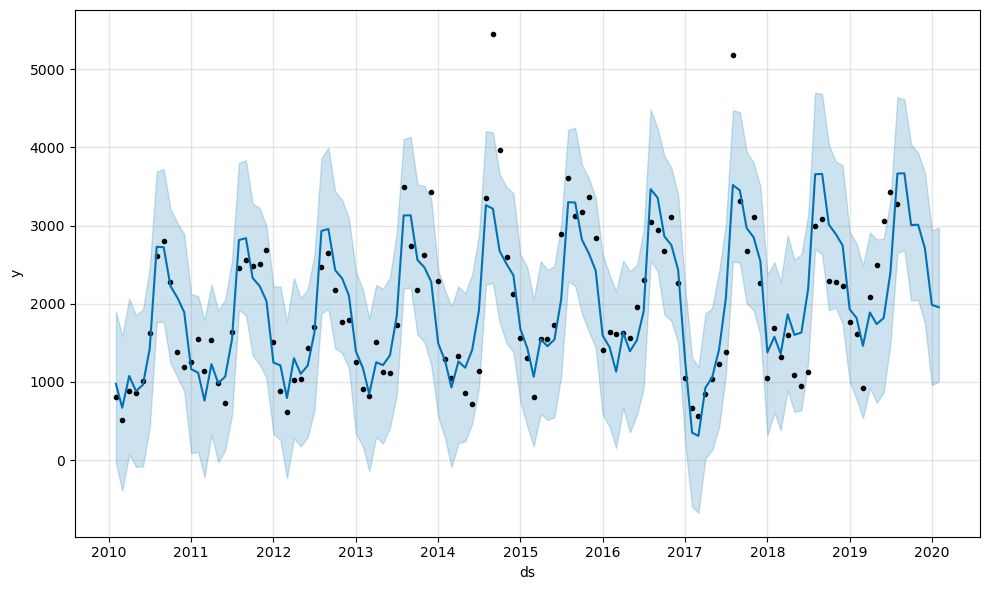

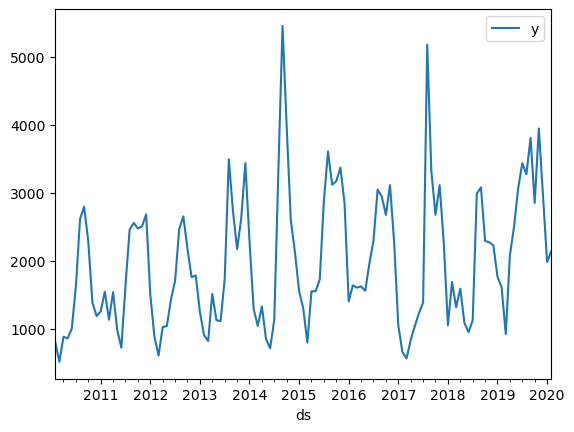

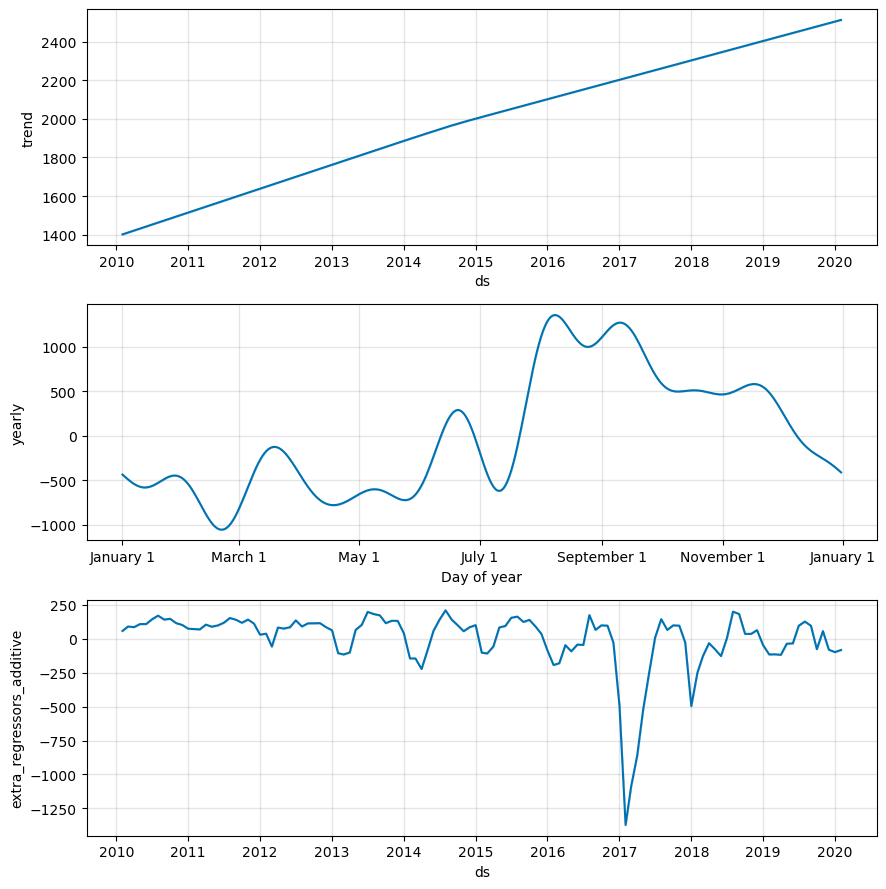

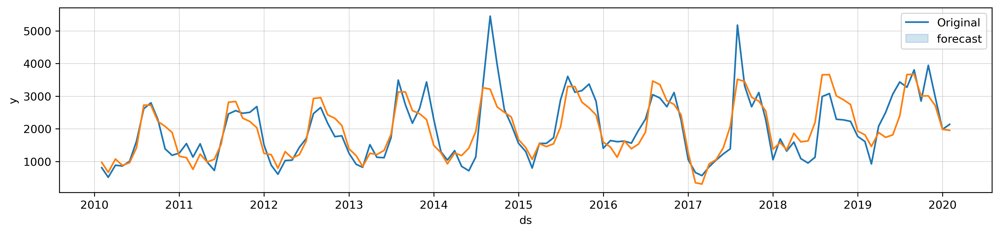

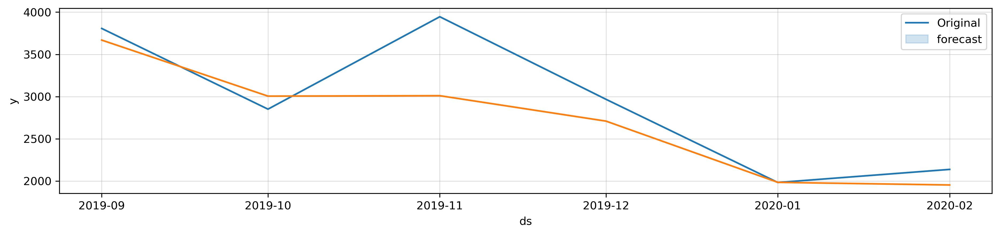

In [62]:
MAE_Prophet = model_prophet(finaldf)


13:53:02 - cmdstanpy - INFO - Chain [1] start processing
13:53:02 - cmdstanpy - INFO - Chain [1] done processing


Index(['Arrival Quantity_mean', 'y', 'ds'], dtype='object')
Prophetdf_test.shape[0]
6
            ds            y
115 2019-09-01  3806.451613
116 2019-10-01  2851.612903
117 2019-11-01  3945.161290
118 2019-12-01  2967.741935
119 2020-01-01  1983.870968
120 2020-02-01  2138.709677
future
            ds  Arrival Quantity_mean
0   2010-02-01              29.029762
1   2010-03-01              27.405556
2   2010-04-01              24.467742
3   2010-05-01              22.201613
4   2010-06-01              19.478495
..         ...                    ...
116 2019-10-01              51.018817
117 2019-11-01              23.271505
118 2019-12-01              49.508065
119 2020-01-01              54.040323
120 2020-02-01              47.110215

[121 rows x 2 columns]
            ds         yhat   yhat_lower   yhat_upper
116 2019-10-01  2935.437678  1895.244917  3905.027818
117 2019-11-01  3033.850087  2110.980230  3966.005786
118 2019-12-01  2663.410746  1780.538651  3579.442740
119 2020-01-01 

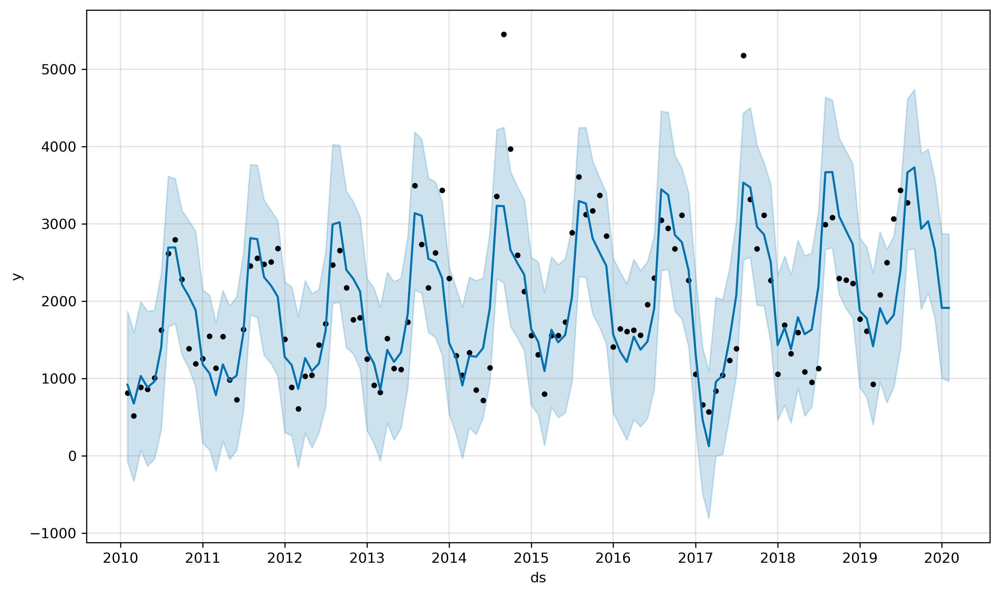

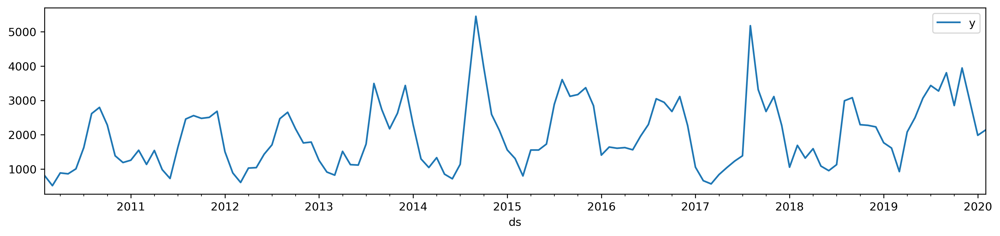

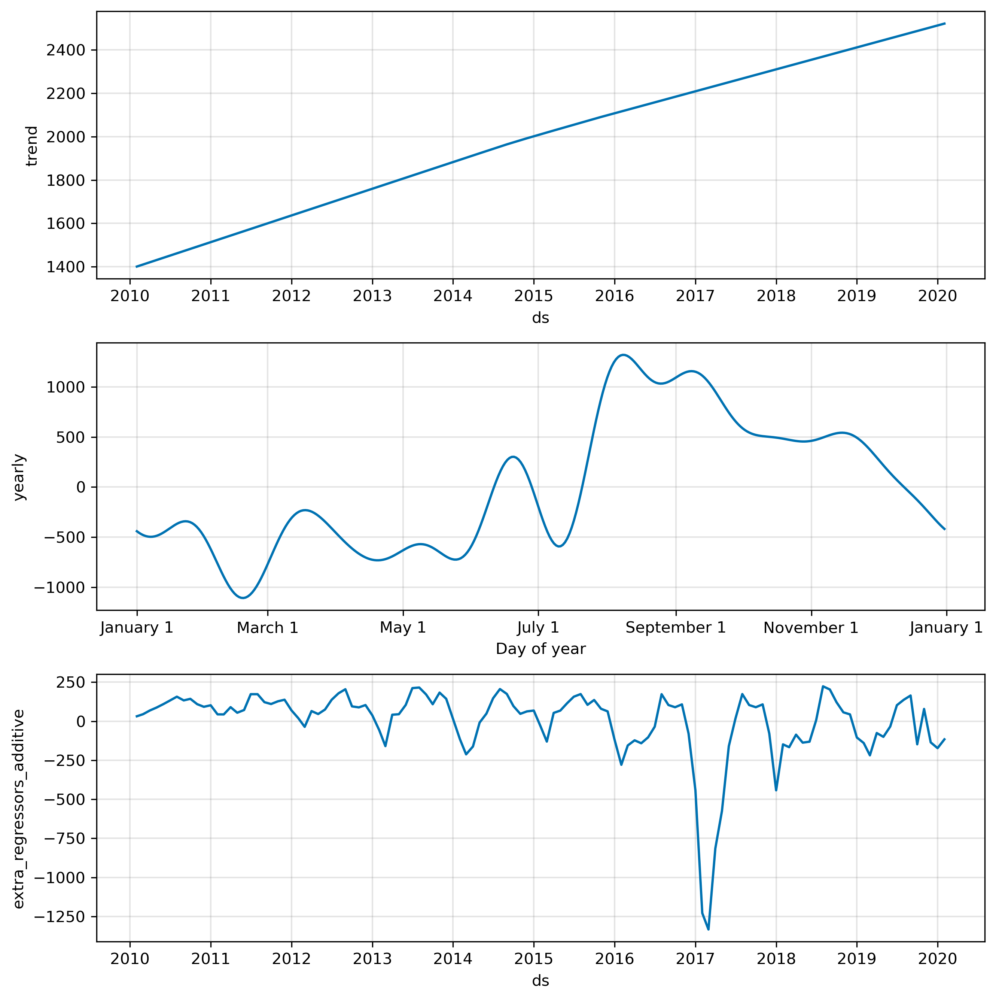

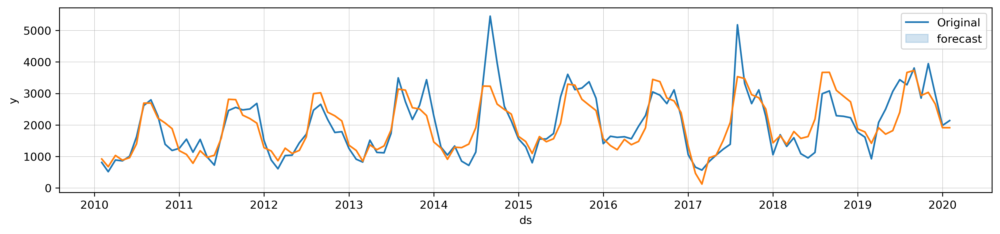

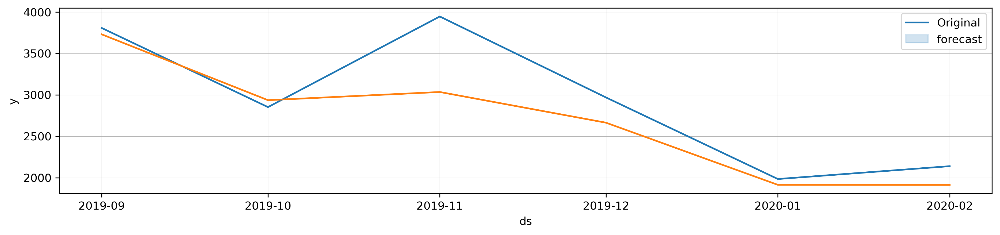

In [63]:
MAE_Prophet_1=model_prophet(finaldf1)
